In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
import tensorflow as tf
train_directory = '/content/drive/MyDrive/Crash_Footage_4/train'
validation_directory = '/content/drive/MyDrive/Crash_Footage_4/val'
test_directory = '/content/drive/MyDrive/Crash_Footage_4/test'

In [3]:
batch_size = 32
img_height = 256
img_width = 256

In [4]:
train_data = tf.keras.preprocessing.image_dataset_from_directory(
    train_directory,
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=True,
    seed=None,
    interpolation="bilinear"
)

val_data = tf.keras.preprocessing.image_dataset_from_directory(
    validation_directory,
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=True,
    seed=None,
    interpolation="bilinear"
)

test_data = tf.keras.preprocessing.image_dataset_from_directory(
    test_directory,
    labels="inferred",
    label_mode="int",
    class_names=None,
    color_mode="rgb",
    batch_size=batch_size,
    image_size=(img_height, img_width),
    shuffle=True,
    seed=None,
    interpolation="bilinear"
)

Found 1154 files belonging to 2 classes.
Found 308 files belonging to 2 classes.
Found 866 files belonging to 2 classes.


In [5]:
class_names = train_data.class_names
print(class_names)

['Accident', 'Non Accident']


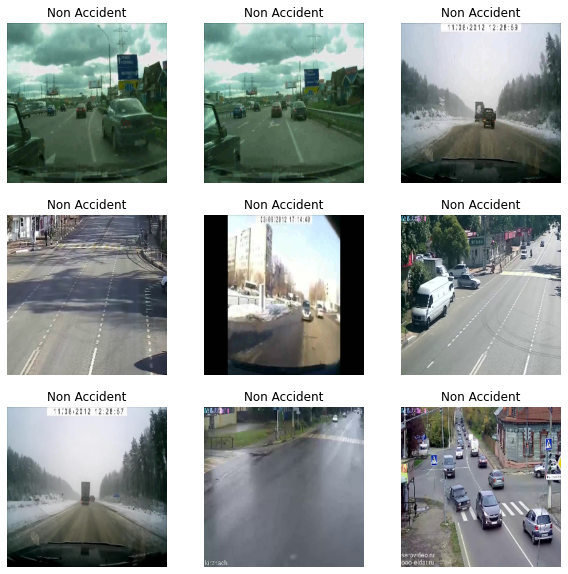

In [6]:
import matplotlib.pyplot as plt

plt.figure(figsize=(10, 10))
for images, labels in train_data.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [7]:
import numpy as np

from tensorflow.keras.applications.resnet50 import ResNet50
from tensorflow.keras.preprocessing import image
from tensorflow.keras.applications.resnet50 import preprocess_input, decode_predictions

from tensorflow.keras.layers import Dense, GlobalAveragePooling2D, Dropout
from tensorflow.keras.models import Model

from tensorflow.keras import layers

from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Conv2D, MaxPooling2D, Flatten
from tensorflow.keras.layers import BatchNormalization

In [8]:
data_augmentation = tf.keras.Sequential([
    layers.experimental.preprocessing.RandomFlip("horizontal_and_vertical"),
    layers.experimental.preprocessing.RandomRotation(0.1),
    layers.experimental.preprocessing.RandomZoom(0.1),
  ])

In [9]:
class_names = train_data.class_names

In [10]:
AUTOTUNE = tf.data.experimental.AUTOTUNE
train_data = train_data.cache().prefetch(buffer_size=AUTOTUNE)
test_data = test_data.cache().prefetch(buffer_size=AUTOTUNE)

In [23]:
model_1 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_1.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [24]:
result_1 = model_1.fit(train_data, validation_data= val_data, epochs = 25)

Epoch 1/25
37/37 [==============================] - 12s 274ms/step - loss: 3.2301 - accuracy: 0.5641 - val_loss: 0.6869 - val_accuracy: 0.6104
Epoch 2/25
37/37 [==============================] - 10s 267ms/step - loss: 0.6635 - accuracy: 0.6092 - val_loss: 0.6780 - val_accuracy: 0.6494
Epoch 3/25
37/37 [==============================] - 10s 268ms/step - loss: 0.6517 - accuracy: 0.6187 - val_loss: 0.6704 - val_accuracy: 0.6364
Epoch 4/25
37/37 [==============================] - 10s 268ms/step - loss: 0.6483 - accuracy: 0.6274 - val_loss: 0.6713 - val_accuracy: 0.6234
Epoch 5/25
37/37 [==============================] - 10s 268ms/step - loss: 0.6515 - accuracy: 0.6248 - val_loss: 0.6722 - val_accuracy: 0.6558
Epoch 6/25
37/37 [==============================] - 10s 267ms/step - loss: 0.6466 - accuracy: 0.6282 - val_loss: 0.6708 - val_accuracy: 0.5974
Epoch 7/25
37/37 [==============================] - 10s 266ms/step - loss: 0.6352 - accuracy: 0.6291 - val_loss: 0.6358 - val_accuracy: 0.6753

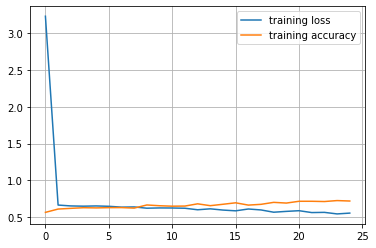

In [25]:
plt.plot(result_1.history['loss'], label = 'training loss')
plt.plot(result_1.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

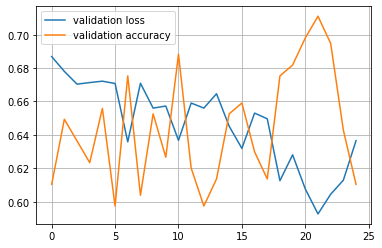

In [26]:
plt.plot(result_1.history['val_loss'], label = 'validation loss')
plt.plot(result_1.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [27]:
test_loss, test_acc = model_1.evaluate(test_data, verbose=2)

28/28 - 1s - loss: 0.7387 - accuracy: 0.5162 - 1s/epoch - 51ms/step


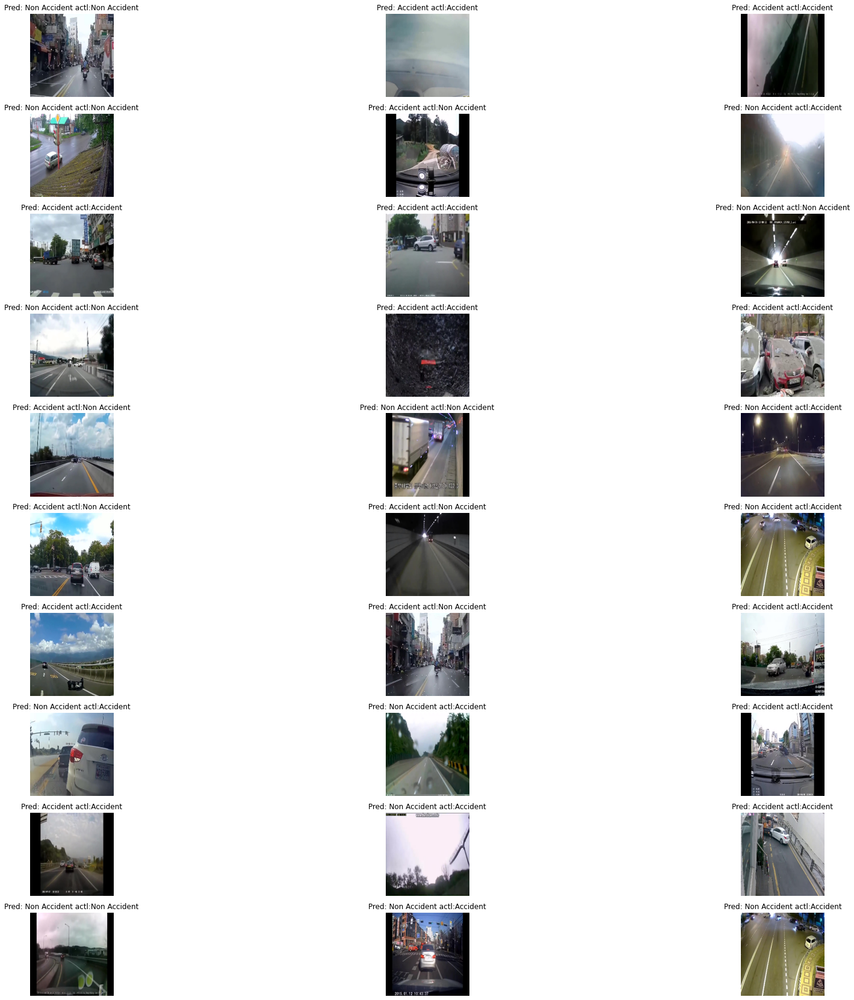

In [52]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_1.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [53]:
resnet = ResNet50(weights='imagenet', include_top=False)

for layer in resnet.layers:
    layer.trainable = False

94781440/94765736 [==============================] - 1s 0us/step


In [54]:
x = resnet.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)
model_2 = Model(resnet.input, predictions)

model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [55]:
result_2 = model_2.fit(train_data, epochs=25, validation_data=val_data)

Epoch 1/25
37/37 [==============================] - 22s 433ms/step - loss: 1.2610 - accuracy: 0.6075 - val_loss: 0.5881 - val_accuracy: 0.6656
Epoch 2/25
37/37 [==============================] - 13s 360ms/step - loss: 0.5093 - accuracy: 0.7444 - val_loss: 0.5286 - val_accuracy: 0.7240
Epoch 3/25
37/37 [==============================] - 13s 357ms/step - loss: 0.4192 - accuracy: 0.8059 - val_loss: 0.5405 - val_accuracy: 0.7078
Epoch 4/25
37/37 [==============================] - 13s 359ms/step - loss: 0.3645 - accuracy: 0.8432 - val_loss: 0.5139 - val_accuracy: 0.7273
Epoch 5/25
37/37 [==============================] - 13s 358ms/step - loss: 0.3109 - accuracy: 0.8830 - val_loss: 0.6100 - val_accuracy: 0.7208
Epoch 6/25
37/37 [==============================] - 13s 359ms/step - loss: 0.2794 - accuracy: 0.8951 - val_loss: 0.6159 - val_accuracy: 0.7273
Epoch 7/25
37/37 [==============================] - 13s 357ms/step - loss: 0.2433 - accuracy: 0.9133 - val_loss: 0.5253 - val_accuracy: 0.7792

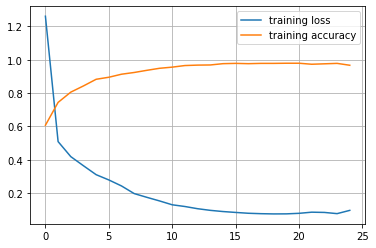

In [56]:
plt.plot(result_2.history['loss'], label = 'training loss')
plt.plot(result_2.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

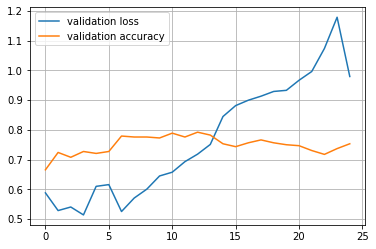

In [57]:
plt.plot(result_2.history['val_loss'], label = 'validation loss')
plt.plot(result_2.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [58]:
test_loss, test_acc = model_2.evaluate(test_data, verbose=2)

28/28 - 7s - loss: 2.2991 - accuracy: 0.5600 - 7s/epoch - 241ms/step


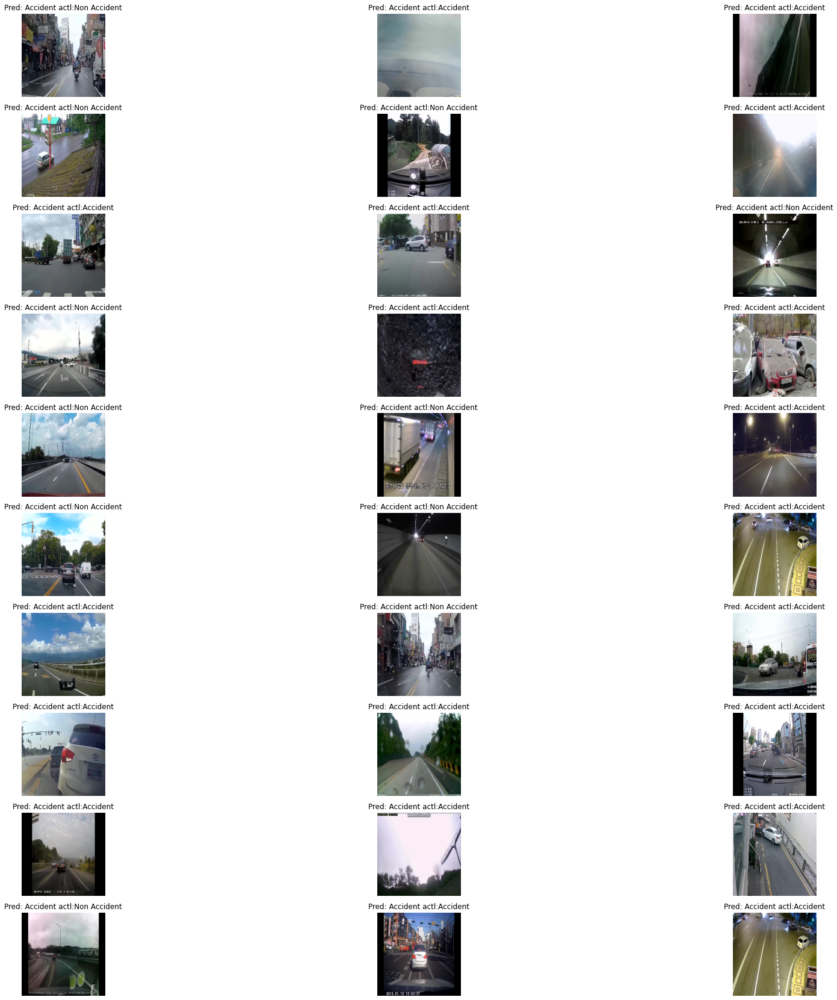

In [59]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_2.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [60]:
from tensorflow.keras.applications import MobileNetV2

In [61]:
MobileNetV2 = MobileNetV2(weights='imagenet', include_top=False)

x = MobileNetV2.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)
model_3 = Model(MobileNetV2.input, predictions)

model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

9420800/9406464 [==============================] - 0s 0us/step


In [62]:
result_3 = model_3.fit(train_data, epochs=25, validation_data=val_data)

Epoch 1/25
37/37 [==============================] - 27s 558ms/step - loss: 0.8177 - accuracy: 0.6508 - val_loss: 9.5966 - val_accuracy: 0.3506
Epoch 2/25
37/37 [==============================] - 19s 502ms/step - loss: 0.4076 - accuracy: 0.8319 - val_loss: 5.8869 - val_accuracy: 0.3539
Epoch 3/25
37/37 [==============================] - 19s 502ms/step - loss: 0.3432 - accuracy: 0.8432 - val_loss: 6.9731 - val_accuracy: 0.6494
Epoch 4/25
37/37 [==============================] - 19s 504ms/step - loss: 0.2945 - accuracy: 0.8813 - val_loss: 7.4475 - val_accuracy: 0.6494
Epoch 5/25
37/37 [==============================] - 19s 503ms/step - loss: 0.1940 - accuracy: 0.9159 - val_loss: 8.8714 - val_accuracy: 0.6494
Epoch 6/25
37/37 [==============================] - 19s 503ms/step - loss: 0.2068 - accuracy: 0.9229 - val_loss: 10.1309 - val_accuracy: 0.6494
Epoch 7/25
37/37 [==============================] - 18s 501ms/step - loss: 0.1943 - accuracy: 0.9281 - val_loss: 4.6748 - val_accuracy: 0.649

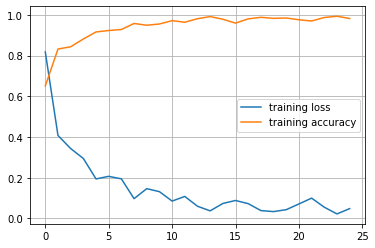

In [63]:
plt.plot(result_3.history['loss'], label = 'training loss')
plt.plot(result_3.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

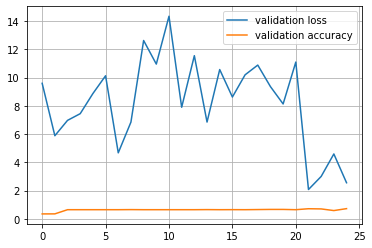

In [64]:
plt.plot(result_3.history['val_loss'], label = 'validation loss')
plt.plot(result_3.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [65]:
test_loss, test_acc = model_3.evaluate(test_data, verbose=2)

28/28 - 3s - loss: 5.6368 - accuracy: 0.4561 - 3s/epoch - 95ms/step


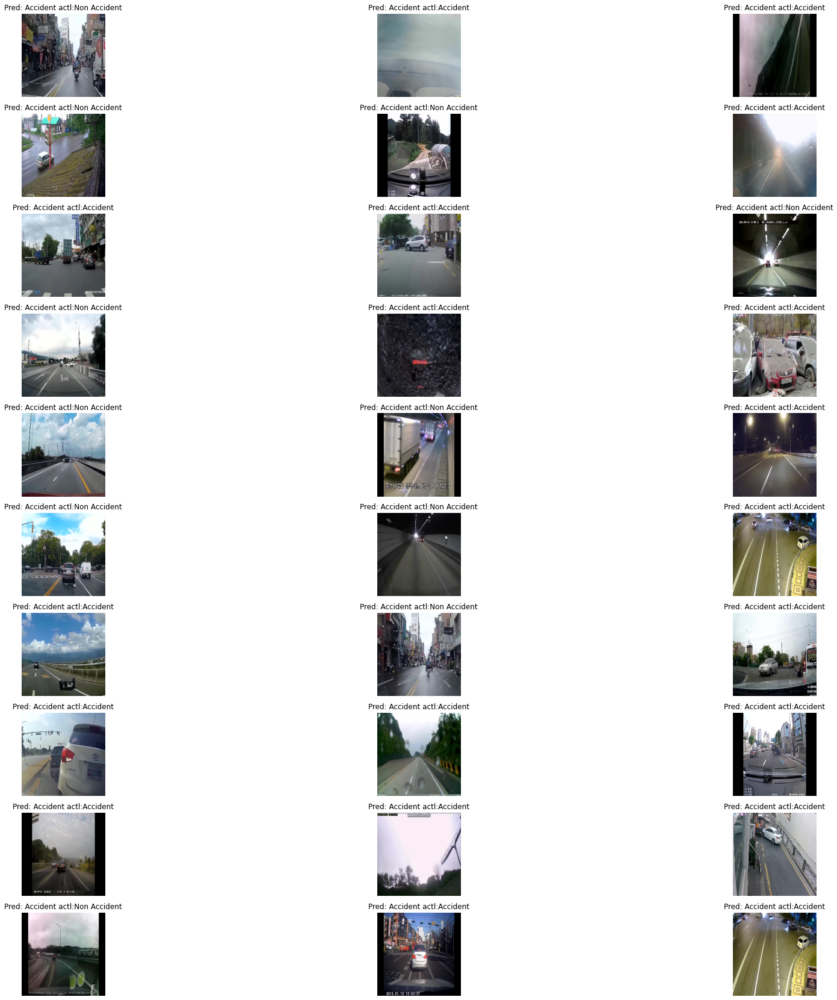

In [66]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_3.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [67]:
from tensorflow.keras.applications import InceptionV3

In [68]:
InceptionV3 = InceptionV3(weights='imagenet', include_top=False)

x = InceptionV3.output
x = GlobalAveragePooling2D()(x)
x = Dense(1024, activation='relu')(x)
predictions = Dense(1, activation='sigmoid')(x)
model_4 = Model(InceptionV3.input, predictions)

model_4.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

87924736/87910968 [==============================] - 1s 0us/step


In [69]:
result_4 = model_4.fit(train_data, epochs=25, validation_data=val_data)

Epoch 1/25
37/37 [==============================] - 49s 986ms/step - loss: 0.8170 - accuracy: 0.5425 - val_loss: 3.2284 - val_accuracy: 0.6494
Epoch 2/25
37/37 [==============================] - 31s 827ms/step - loss: 0.6668 - accuracy: 0.5901 - val_loss: 4.7766 - val_accuracy: 0.6494
Epoch 3/25
37/37 [==============================] - 31s 829ms/step - loss: 0.6384 - accuracy: 0.5936 - val_loss: 0.6719 - val_accuracy: 0.6494
Epoch 4/25
37/37 [==============================] - 31s 829ms/step - loss: 0.6118 - accuracy: 0.6750 - val_loss: 15.2350 - val_accuracy: 0.6494
Epoch 5/25
37/37 [==============================] - 31s 825ms/step - loss: 0.5453 - accuracy: 0.7383 - val_loss: 1.6325 - val_accuracy: 0.6494
Epoch 6/25
37/37 [==============================] - 31s 827ms/step - loss: 0.4702 - accuracy: 0.7799 - val_loss: 1.6912 - val_accuracy: 0.6104
Epoch 7/25
37/37 [==============================] - 31s 827ms/step - loss: 0.4389 - accuracy: 0.7955 - val_loss: 1.7253 - val_accuracy: 0.675

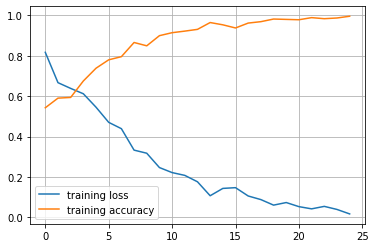

In [70]:
plt.plot(result_4.history['loss'], label = 'training loss')
plt.plot(result_4.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

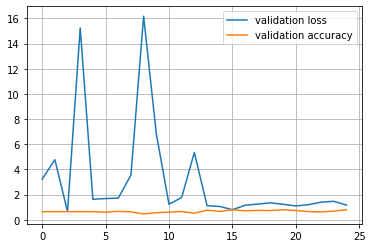

In [71]:
plt.plot(result_4.history['val_loss'], label = 'validation loss')
plt.plot(result_4.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [72]:
test_loss, test_acc = model_4.evaluate(test_data, verbose=2)

28/28 - 6s - loss: 3.2644 - accuracy: 0.5774 - 6s/epoch - 203ms/step


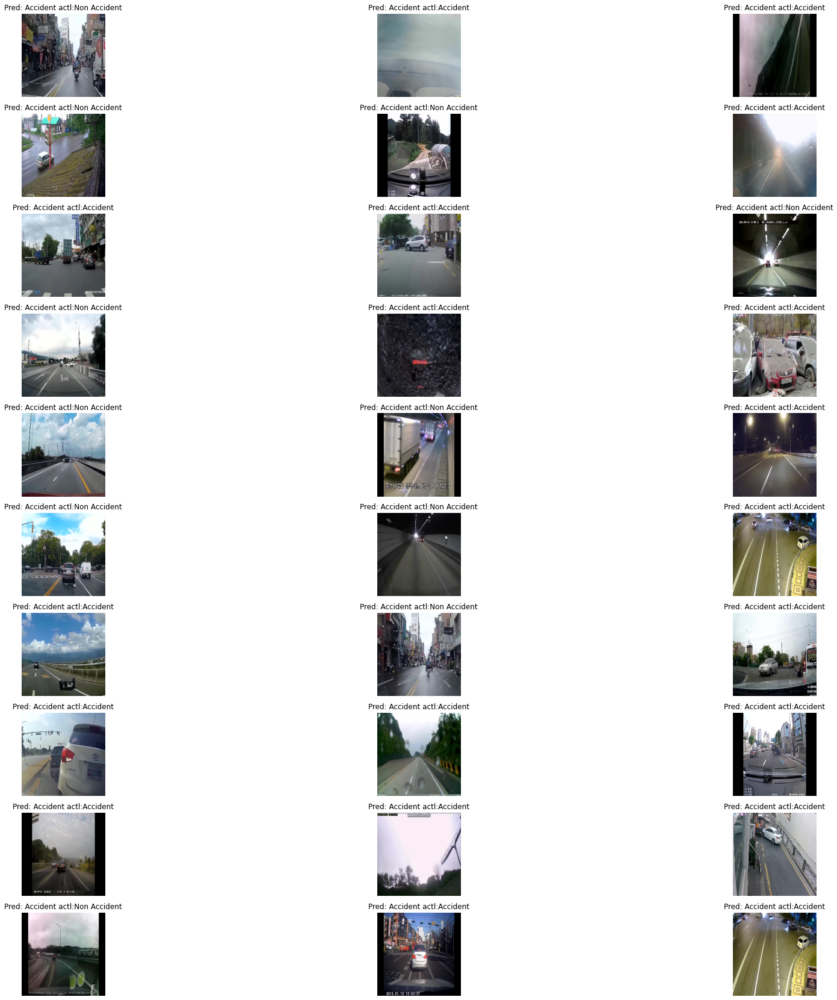

In [73]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_3.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [74]:
model_1.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [75]:
model_1.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 sequential (Sequential)     (None, 256, 256, 3)       0         
                                                                 
 batch_normalization_2 (Batc  (None, 256, 256, 3)      12        
 hNormalization)                                                 
                                                                 
 conv2d_7 (Conv2D)           (None, 254, 254, 32)      896       
                                                                 
 dropout_9 (Dropout)         (None, 254, 254, 32)      0         
                                                                 
 max_pooling2d_7 (MaxPooling  (None, 127, 127, 32)     0         
 2D)                                                             
                                                                 
 conv2d_8 (Conv2D)           (None, 125, 125, 64)     

In [76]:
model_1.build((None, 256, 256, 3))

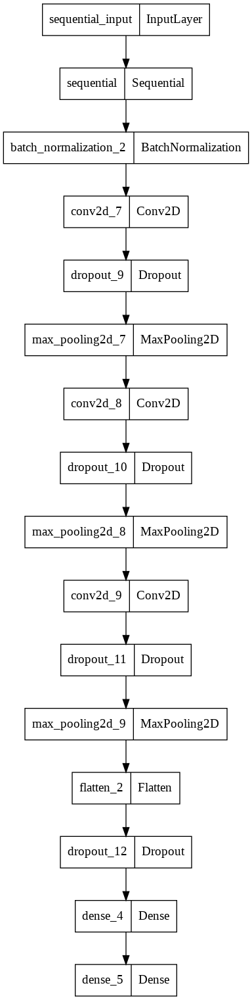

In [77]:
tf.keras.utils.plot_model(
    model_1,
    to_file="model.png",
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=False,
)

In [78]:
model_2.build((None, 256, 256, 3))

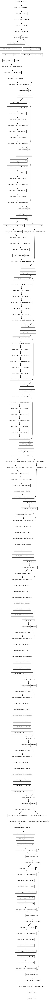

In [79]:
tf.keras.utils.plot_model(
    model_2,
    to_file="model.png",
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=False,
)

In [80]:
model_3.build((None, 256, 256, 3))

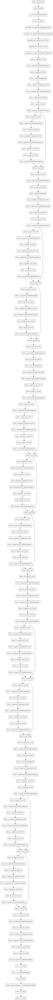

In [81]:
tf.keras.utils.plot_model(
    model_3,
    to_file="model.png",
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=False,
)

In [82]:
model_4.build((None, 256, 256, 3))

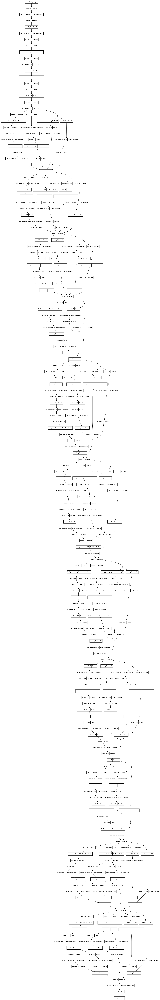

In [83]:
tf.keras.utils.plot_model(
    model_4,
    to_file="model.png",
    show_shapes=False,
    show_dtype=False,
    show_layer_names=True,
    rankdir="TB",
    expand_nested=False,
    dpi=96,
    layer_range=None,
    show_layer_activations=False,
)

In [11]:
model_5 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(256, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(512, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(1024, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(2048, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_5.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [12]:
result_5 = model_5.fit(train_data, validation_data= val_data, epochs = 25)

Epoch 1/25
37/37 [==============================] - 203s 5s/step - loss: 2.0811 - accuracy: 0.5771 - val_loss: 0.6794 - val_accuracy: 0.6494
Epoch 2/25
37/37 [==============================] - 11s 303ms/step - loss: 0.6760 - accuracy: 0.5901 - val_loss: 0.6842 - val_accuracy: 0.6494
Epoch 3/25
37/37 [==============================] - 11s 302ms/step - loss: 0.6795 - accuracy: 0.5901 - val_loss: 0.6783 - val_accuracy: 0.6494
Epoch 4/25
37/37 [==============================] - 11s 302ms/step - loss: 0.6796 - accuracy: 0.5901 - val_loss: 0.6769 - val_accuracy: 0.6494
Epoch 5/25
37/37 [==============================] - 11s 301ms/step - loss: 0.6812 - accuracy: 0.5919 - val_loss: 0.6762 - val_accuracy: 0.6558
Epoch 6/25
37/37 [==============================] - 11s 300ms/step - loss: 0.6813 - accuracy: 0.5789 - val_loss: 0.6663 - val_accuracy: 0.6494
Epoch 7/25
37/37 [==============================] - 11s 301ms/step - loss: 0.6770 - accuracy: 0.5901 - val_loss: 0.6688 - val_accuracy: 0.6494
E

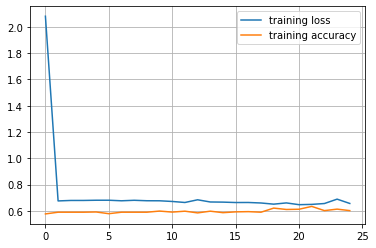

In [13]:
plt.plot(result_5.history['loss'], label = 'training loss')
plt.plot(result_5.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

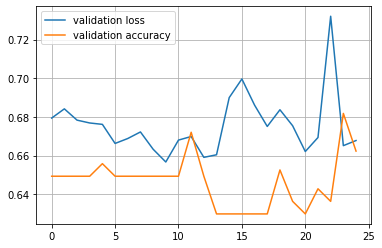

In [14]:
plt.plot(result_5.history['val_loss'], label = 'validation loss')
plt.plot(result_5.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [15]:
test_loss, test_acc = model_5.evaluate(test_data, verbose=2)

28/28 - 209s - loss: 0.7160 - accuracy: 0.3776 - 209s/epoch - 7s/step


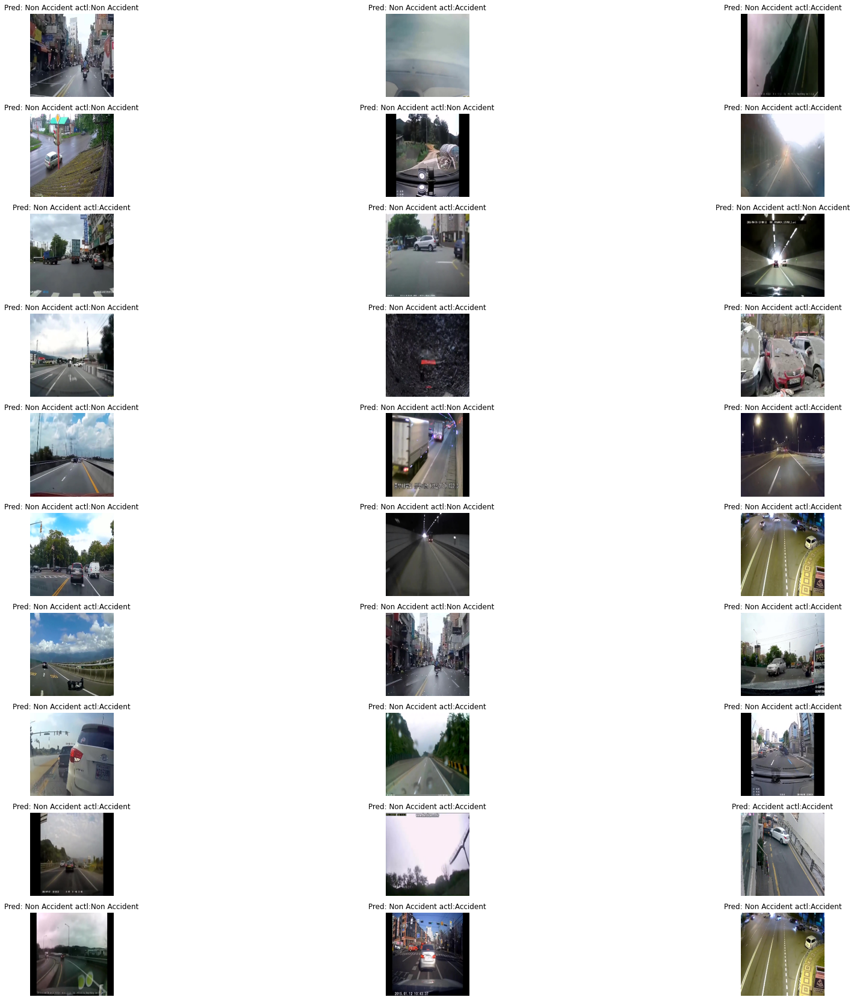

In [16]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_5.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [17]:
model_6 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(64, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_6.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [18]:
result_6 = model_6.fit(train_data, validation_data= val_data, epochs = 25)

Epoch 1/25
37/37 [==============================] - 9s 191ms/step - loss: 9.8201 - accuracy: 0.4792 - val_loss: 0.6910 - val_accuracy: 0.6494
Epoch 2/25
37/37 [==============================] - 7s 185ms/step - loss: 0.6908 - accuracy: 0.5901 - val_loss: 0.6861 - val_accuracy: 0.6494
Epoch 3/25
37/37 [==============================] - 7s 186ms/step - loss: 0.6880 - accuracy: 0.5901 - val_loss: 0.6814 - val_accuracy: 0.6494
Epoch 4/25
37/37 [==============================] - 7s 185ms/step - loss: 0.6856 - accuracy: 0.5901 - val_loss: 0.6772 - val_accuracy: 0.6494
Epoch 5/25
37/37 [==============================] - 7s 185ms/step - loss: 0.6836 - accuracy: 0.5901 - val_loss: 0.6737 - val_accuracy: 0.6494
Epoch 6/25
37/37 [==============================] - 7s 185ms/step - loss: 0.6820 - accuracy: 0.5901 - val_loss: 0.6706 - val_accuracy: 0.6494
Epoch 7/25
37/37 [==============================] - 7s 184ms/step - loss: 0.6808 - accuracy: 0.5901 - val_loss: 0.6681 - val_accuracy: 0.6494
Epoch 

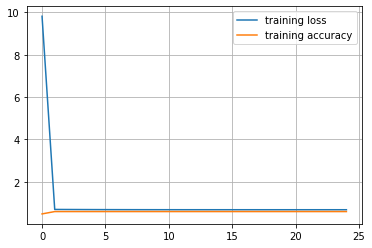

In [19]:
plt.plot(result_6.history['loss'], label = 'training loss')
plt.plot(result_6.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

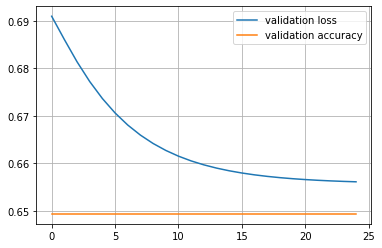

In [20]:
plt.plot(result_6.history['val_loss'], label = 'validation loss')
plt.plot(result_6.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [21]:
test_loss, test_acc = model_6.evaluate(test_data, verbose=2)

28/28 - 1s - loss: 0.7552 - accuracy: 0.3661 - 747ms/epoch - 27ms/step


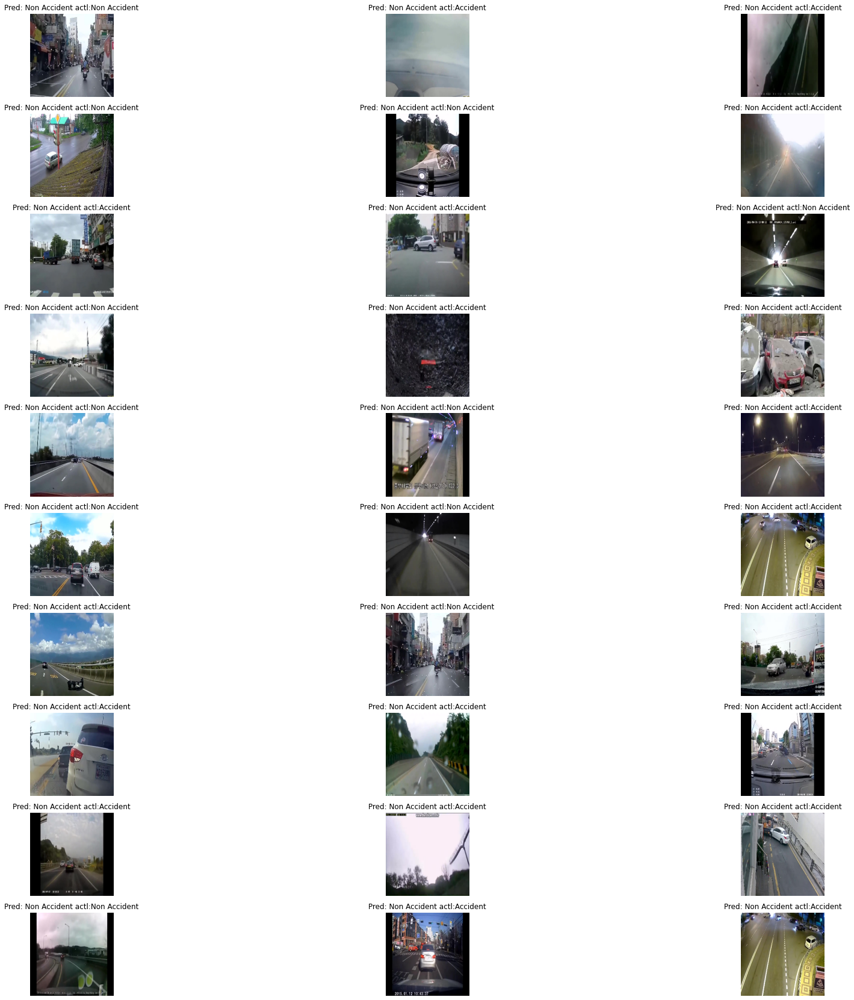

In [22]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_6.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [28]:
model_7 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_7.compile(optimizer='SGD',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [29]:
result_7 = model_7.fit(train_data, validation_data= val_data, epochs = 25)

Epoch 1/25
37/37 [==============================] - 13s 297ms/step - loss: 0.7421 - accuracy: 0.5910 - val_loss: 0.6421 - val_accuracy: 0.6526
Epoch 2/25
37/37 [==============================] - 11s 303ms/step - loss: 0.6663 - accuracy: 0.5936 - val_loss: 0.6775 - val_accuracy: 0.5682
Epoch 3/25
37/37 [==============================] - 10s 266ms/step - loss: 0.6571 - accuracy: 0.6144 - val_loss: 0.6683 - val_accuracy: 0.6039
Epoch 4/25
37/37 [==============================] - 10s 267ms/step - loss: 0.6529 - accuracy: 0.6127 - val_loss: 0.6687 - val_accuracy: 0.6364
Epoch 5/25
37/37 [==============================] - 10s 264ms/step - loss: 0.6426 - accuracy: 0.6421 - val_loss: 0.6944 - val_accuracy: 0.4935
Epoch 6/25
37/37 [==============================] - 10s 264ms/step - loss: 0.6356 - accuracy: 0.6438 - val_loss: 0.6569 - val_accuracy: 0.6006
Epoch 7/25
37/37 [==============================] - 10s 263ms/step - loss: 0.6359 - accuracy: 0.6352 - val_loss: 0.6564 - val_accuracy: 0.6039

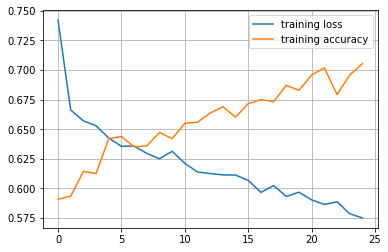

In [30]:
plt.plot(result_7.history['loss'], label = 'training loss')
plt.plot(result_7.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

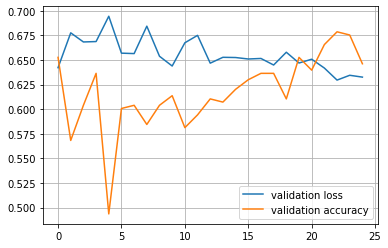

In [31]:
plt.plot(result_7.history['val_loss'], label = 'validation loss')
plt.plot(result_7.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [32]:
test_loss, test_acc = model_7.evaluate(test_data, verbose=2)

28/28 - 1s - loss: 0.7403 - accuracy: 0.4492 - 1s/epoch - 50ms/step


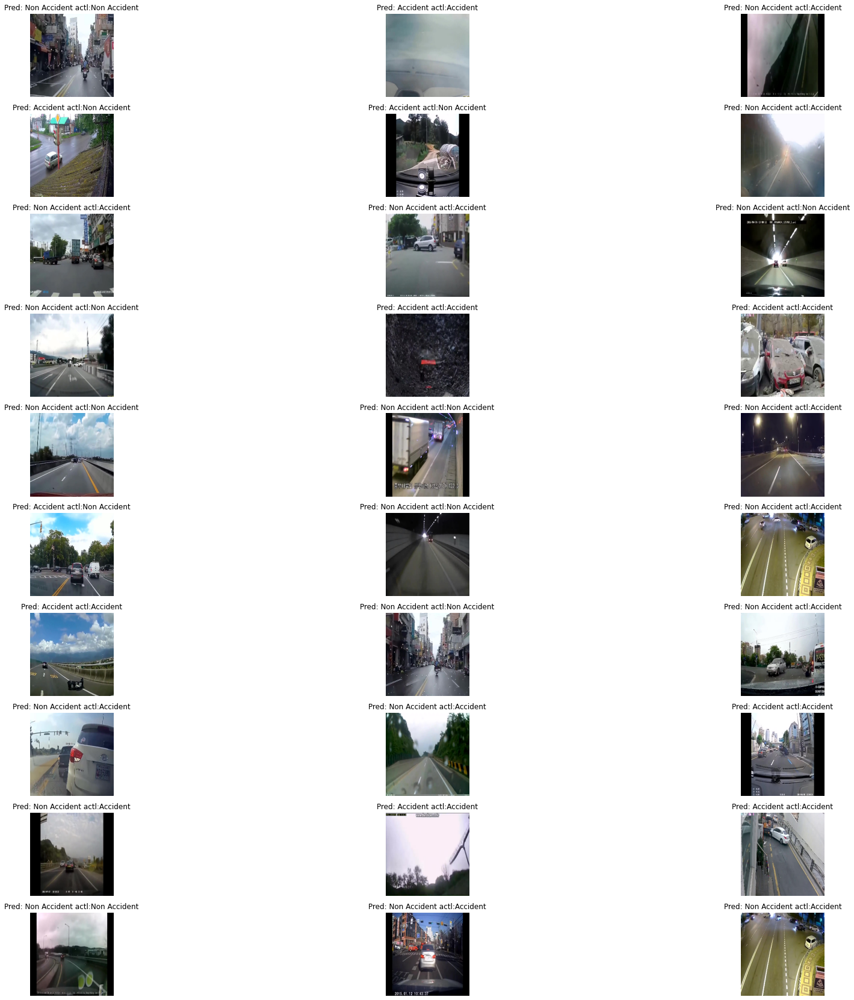

In [33]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_7.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [34]:
model_8 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_8.compile(optimizer='Adagrad',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [35]:
result_8 = model_8.fit(train_data, validation_data= val_data, epochs = 25)

Epoch 1/25
37/37 [==============================] - 13s 308ms/step - loss: 0.7211 - accuracy: 0.5919 - val_loss: 0.6574 - val_accuracy: 0.6494
Epoch 2/25
37/37 [==============================] - 10s 272ms/step - loss: 0.6715 - accuracy: 0.5849 - val_loss: 0.6517 - val_accuracy: 0.6039
Epoch 3/25
37/37 [==============================] - 10s 275ms/step - loss: 0.6618 - accuracy: 0.6040 - val_loss: 0.6705 - val_accuracy: 0.6006
Epoch 4/25
37/37 [==============================] - 10s 268ms/step - loss: 0.6610 - accuracy: 0.6170 - val_loss: 0.6915 - val_accuracy: 0.5390
Epoch 5/25
37/37 [==============================] - 11s 302ms/step - loss: 0.6554 - accuracy: 0.6083 - val_loss: 0.6888 - val_accuracy: 0.5909
Epoch 6/25
37/37 [==============================] - 10s 274ms/step - loss: 0.6501 - accuracy: 0.6161 - val_loss: 0.6744 - val_accuracy: 0.5877
Epoch 7/25
37/37 [==============================] - 10s 269ms/step - loss: 0.6464 - accuracy: 0.6282 - val_loss: 0.6645 - val_accuracy: 0.6234

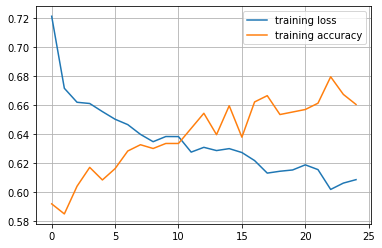

In [36]:
plt.plot(result_8.history['loss'], label = 'training loss')
plt.plot(result_8.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

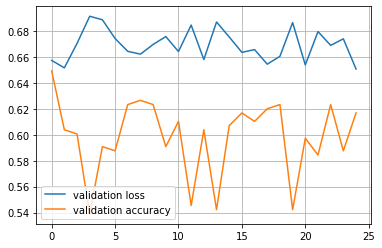

In [37]:
plt.plot(result_8.history['val_loss'], label = 'validation loss')
plt.plot(result_8.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [38]:
test_loss, test_acc = model_8.evaluate(test_data, verbose=2)

28/28 - 1s - loss: 0.7574 - accuracy: 0.4030 - 1s/epoch - 51ms/step


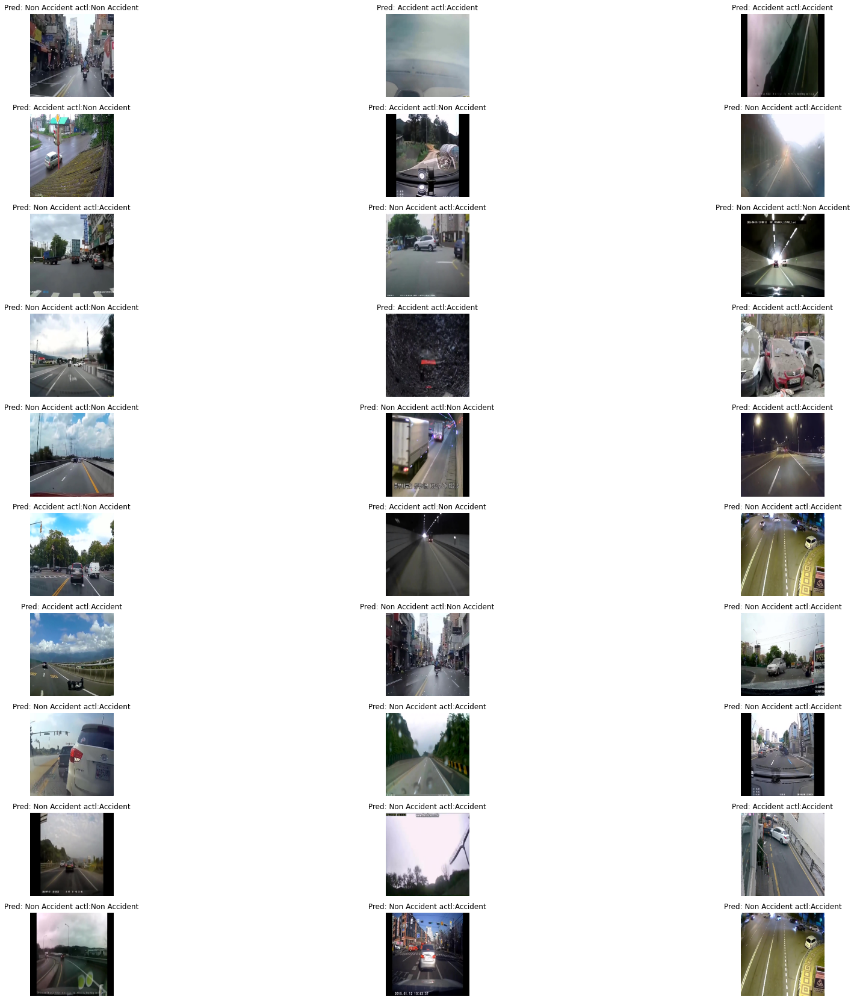

In [39]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_8.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [40]:
model_9 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_9.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [41]:
result_9 = model_9.fit(train_data, validation_data= val_data, epochs = 50)

Epoch 1/50
37/37 [==============================] - 12s 274ms/step - loss: 2.0513 - accuracy: 0.5806 - val_loss: 0.6893 - val_accuracy: 0.6136
Epoch 2/50
37/37 [==============================] - 10s 270ms/step - loss: 0.6692 - accuracy: 0.5901 - val_loss: 0.6932 - val_accuracy: 0.5779
Epoch 3/50
37/37 [==============================] - 10s 269ms/step - loss: 0.6721 - accuracy: 0.6023 - val_loss: 0.6862 - val_accuracy: 0.5779
Epoch 4/50
37/37 [==============================] - 10s 269ms/step - loss: 0.6758 - accuracy: 0.5919 - val_loss: 0.6633 - val_accuracy: 0.6136
Epoch 5/50
37/37 [==============================] - 10s 268ms/step - loss: 0.6950 - accuracy: 0.5797 - val_loss: 0.6773 - val_accuracy: 0.6494
Epoch 6/50
37/37 [==============================] - 10s 267ms/step - loss: 0.6815 - accuracy: 0.5849 - val_loss: 0.6629 - val_accuracy: 0.6494
Epoch 7/50
37/37 [==============================] - 10s 266ms/step - loss: 0.6766 - accuracy: 0.5893 - val_loss: 0.6556 - val_accuracy: 0.6494

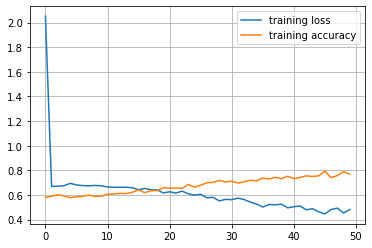

In [42]:
plt.plot(result_9.history['loss'], label = 'training loss')
plt.plot(result_9.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

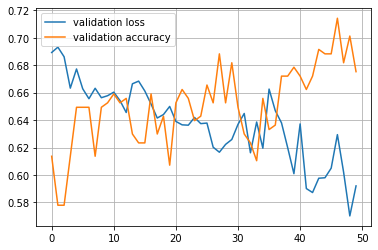

In [43]:
plt.plot(result_9.history['val_loss'], label = 'validation loss')
plt.plot(result_9.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [44]:
test_loss, test_acc = model_9.evaluate(test_data, verbose=2)

28/28 - 2s - loss: 0.8964 - accuracy: 0.4619 - 2s/epoch - 56ms/step


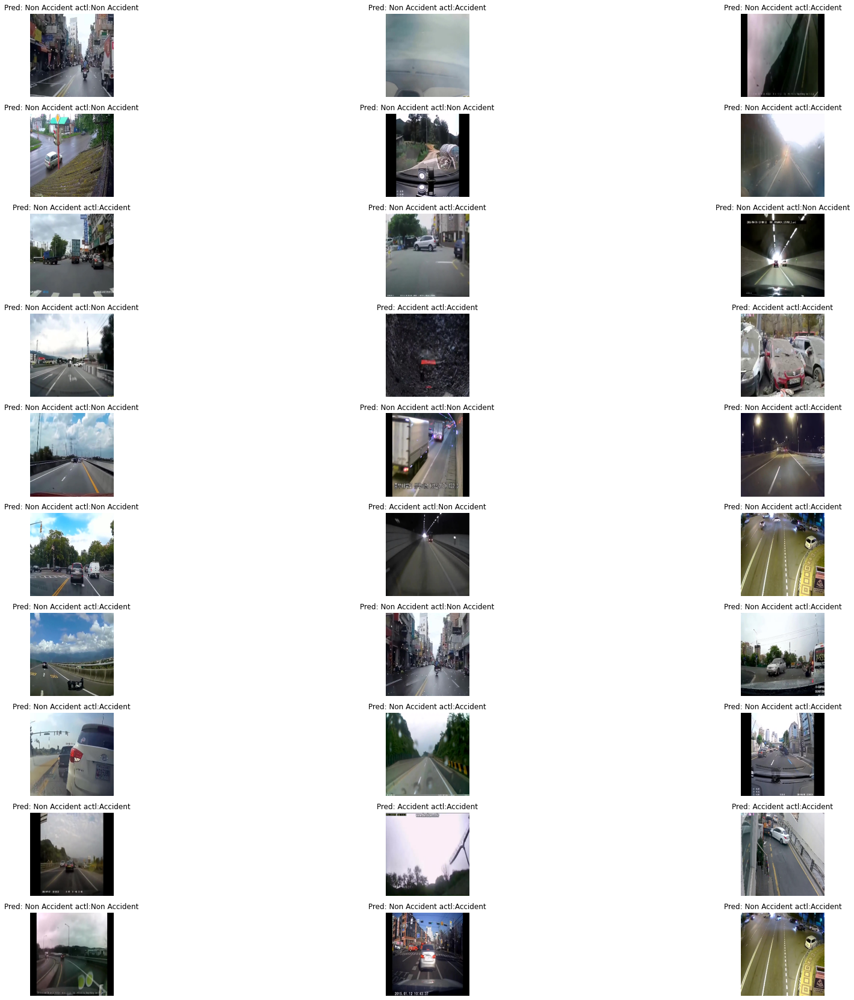

In [45]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_9.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)

In [46]:
model_10 = tf.keras.models.Sequential([
  data_augmentation,                                  
  layers.BatchNormalization(),
  layers.Conv2D(32, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(64, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Conv2D(128, 3, activation='relu'),
  Dropout(0.25),
  layers.MaxPooling2D(),
  layers.Flatten(),
  Dropout(0.25),
  layers.Dense(256, activation='relu'),
  layers.Dense(len(class_names), activation= 'softmax')
])

model_10.compile(optimizer='adam',loss='sparse_categorical_crossentropy', metrics=['accuracy'])

In [47]:
result_10 = model_10.fit(train_data, validation_data= val_data, epochs = 200)

Epoch 1/200
37/37 [==============================] - 12s 275ms/step - loss: 3.0394 - accuracy: 0.5728 - val_loss: 0.6765 - val_accuracy: 0.6494
Epoch 2/200
37/37 [==============================] - 10s 268ms/step - loss: 0.6735 - accuracy: 0.5901 - val_loss: 0.6826 - val_accuracy: 0.6494
Epoch 3/200
37/37 [==============================] - 10s 267ms/step - loss: 0.6669 - accuracy: 0.5910 - val_loss: 0.6819 - val_accuracy: 0.6494
Epoch 4/200
37/37 [==============================] - 10s 268ms/step - loss: 0.6668 - accuracy: 0.5901 - val_loss: 0.6745 - val_accuracy: 0.6494
Epoch 5/200
37/37 [==============================] - 10s 267ms/step - loss: 0.6620 - accuracy: 0.5927 - val_loss: 0.6787 - val_accuracy: 0.6623
Epoch 6/200
37/37 [==============================] - 10s 267ms/step - loss: 0.6582 - accuracy: 0.5858 - val_loss: 0.6680 - val_accuracy: 0.6494
Epoch 7/200
37/37 [==============================] - 10s 274ms/step - loss: 0.6411 - accuracy: 0.6092 - val_loss: 0.6532 - val_accuracy:

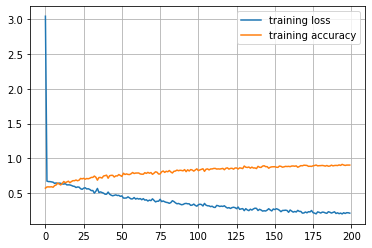

In [48]:
plt.plot(result_10.history['loss'], label = 'training loss')
plt.plot(result_10.history['accuracy'], label = 'training accuracy')
plt.grid(True)
plt.legend()

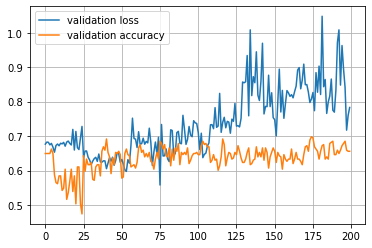

In [49]:
plt.plot(result_10.history['val_loss'], label = 'validation loss')
plt.plot(result_10.history['val_accuracy'], label = 'validation accuracy')
plt.grid(True)
plt.legend()

In [50]:
test_loss, test_acc = model_10.evaluate(test_data, verbose=2)

28/28 - 2s - loss: 1.5966 - accuracy: 0.5185 - 2s/epoch - 56ms/step


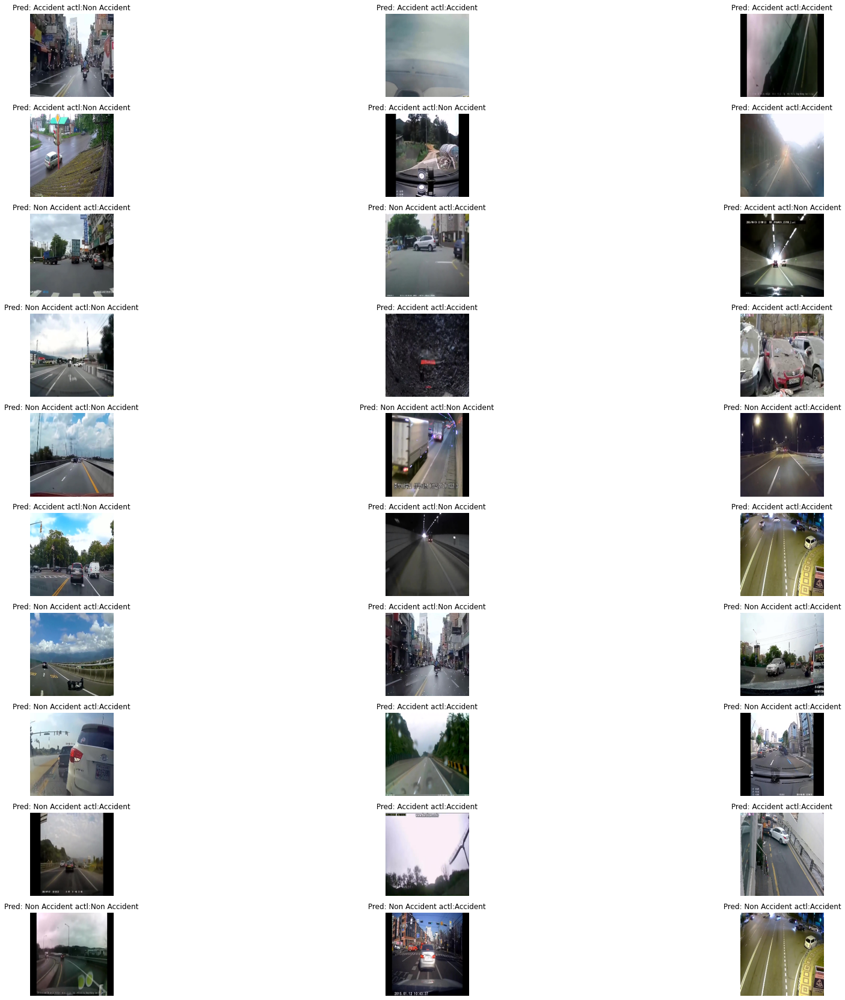

In [51]:
AccuracyVector = []
plt.figure(figsize=(30, 30))
for images, labels in test_data.take(1):
    predictions = model_10.predict(images)
    predlabel = []
    prdlbl = []
    
    for mem in predictions:
        predlabel.append(class_names[np.argmax(mem)])
        prdlbl.append(np.argmax(mem))
    
    AccuracyVector = np.array(prdlbl) == labels
    for i in range(30):
        ax = plt.subplot(10, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title('Pred: '+ predlabel[i]+' actl:'+class_names[labels[i]] )
        plt.axis('off')
        plt.grid(True)